In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
# import seaborn as sns 
import datetime
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import Scatter, Figure, Layout
import plotly
import plotly.graph_objs as go
import plotly.express as px
from IPython.display import Markdown as md
init_notebook_mode(connected=False)
import io
import requests
import re

## COVID-19 in Italy. Visuals

___


##### *(alternatively, see results and code together [here](https://random-r.github.io/Italy_ipynb.html))*
&nbsp;

___

#### Data source: [this GitHubi page](https://github.com/pcm-dpc/COVID-19)

> __Authors and sources mentioned__: Editore/Autore del dataset: Dipartimento della Protezione Civile. Categoria ISO 19115: Salute. Dati forniti dal Ministero della Salute.

>> ##### __Regional data files__ (_Dati per Regione_):
>>  * Struttura file giornaliero: dpc-covid19-ita-regioni-yyyymmdd.csv (dpc-covid19-ita-regioni-20200224.csv)
>>  * File complessivo: dpc-covid19-ita-regioni.csv
>>  * File ultimi dati (latest): dpc-covid19-ita-regioni-latest.csv

&nbsp;

* Below we use the 'dpc-covid19-ita-regioni.csv' file (updated on daily basis, so far). 

* In addition, we get __regional population size__ from https://it.wikipedia.org/wiki/Regione_(Italia) for per capita measures

In [2]:
URL='https://it.wikipedia.org/wiki/Regione_(Italia)'
res=requests.get(URL)
tables=pd.read_html(res.text)
dt = tables[13]

In [3]:
def dewhite(x):
    ''.join(re.findall('\d+', x))

dt2 = dt[['Regione','Popolazione (ab.)']].copy()
dt2.columns = ['Region','Pop']
    
dt2.Pop = dt2.Pop.apply(lambda x: ''.join(re.findall('\d+', x))).astype(int)

In [4]:
s = requests.get("https://raw.githubusercontent.com/pcm-dpc/COVID-19/master/dati-regioni/dpc-covid19-ita-regioni.csv").content
dat = pd.read_csv(io.StringIO(s.decode('utf-8')))
cdate = dat.data.max()

md("Currently data as of date: {}".format(cdate))

Currently data as of date: 2021-03-11T17:00:00

___
&nbsp;

#### What's in the original dataframe?

In [5]:
md("All column names: {}".format(dat.columns.tolist()))

All column names: ['data', 'stato', 'codice_regione', 'denominazione_regione', 'lat', 'long', 'ricoverati_con_sintomi', 'terapia_intensiva', 'totale_ospedalizzati', 'isolamento_domiciliare', 'totale_positivi', 'variazione_totale_positivi', 'nuovi_positivi', 'dimessi_guariti', 'deceduti', 'casi_da_sospetto_diagnostico', 'casi_da_screening', 'totale_casi', 'tamponi', 'casi_testati', 'note', 'ingressi_terapia_intensiva', 'note_test', 'note_casi', 'totale_positivi_test_molecolare', 'totale_positivi_test_antigenico_rapido', 'tamponi_test_molecolare', 'tamponi_test_antigenico_rapido', 'codice_nuts_1', 'codice_nuts_2']

In [6]:
df = dat.drop(['stato','codice_regione'], axis=1)
df.columns = ['Date','Region','Lat','Long','HospWithSymptoms','IC','HospTotal','AtHome','CurrentlyPositive','VariationOfPositives','NewPositives','Recovered', 'Deaths','Diagnostico','Screening','TotalCases','NoOfTests','casi_testati','note','ingr_ter_intens','note_test','note_casi', 'totale_positivi_test_molecolare', 'totale_positivi_test_antigenico_rapido', 'tamponi_test_molecolare', 'tamponi_test_antigenico_rapido', 'codice_nuts_1', 'codice_nuts_2']

df = pd.merge(df, dt2, left_on='Region', right_on='Region')

df['Date'] = pd.to_datetime(df['Date']).dt.date
df = df.set_index(df["Date"])
df.index = pd.to_datetime(df.index)

df['NewPositives'] = np.abs(df['NewPositives'])

dat.tail(5)

,data,stato,codice_regione,denominazione_regione,lat,long,ricoverati_con_sintomi,terapia_intensiva,totale_ospedalizzati,isolamento_domiciliare,...,note,ingressi_terapia_intensiva,note_test,note_casi,totale_positivi_test_molecolare,totale_positivi_test_antigenico_rapido,tamponi_test_molecolare,tamponi_test_antigenico_rapido,codice_nuts_1,codice_nuts_2
8017,2021-03-11T17:00:00,ITA,19,Sicilia,38.115697,13.362357,671,100,771,12751,...,NaN,3.0,NaN,NaN,158865.0,0.0,1832727.0,868928.0,ITG,ITG1
8018,2021-03-11T17:00:00,ITA,9,Toscana,43.769231,11.255889,1280,208,1488,21409,...,NaN,14.0,NaN,NaN,168010.0,1037.0,2623187.0,351213.0,ITI,ITI1
8019,2021-03-11T17:00:00,ITA,10,Umbria,43.106758,12.388247,407,80,487,6110,...,"Si fa presente che 9 dei ricoveri NON UTI, non...",5.0,NaN,NaN,47292.0,0.0,730548.0,145857.0,ITI,ITI2
8020,2021-03-11T17:00:00,ITA,2,Valle d'Aosta,45.737503,7.320149,12,2,14,216,...,NaN,0.0,NaN,NaN,8212.0,0.0,76641.0,5449.0,ITC,ITC2
8021,2021-03-11T17:00:00,ITA,5,Veneto,45.434905,12.338452,1073,154,1227,30447,...,Nei valori riportati per le terapie intensive ...,19.0,NaN,NaN,341780.0,6333.0,4190947.0,1232282.0,ITH,ITH3


___

&nbsp;

#### Variable names to English and their explanation
  * HospWithSymptoms : _Currently hospitalized patients with symptoms_
  * IC : _Intensive care_
  * HospTotal: _Total number of currently hospitalized patients_
  * AtHome : _Currently at home confinement_
  * CurrentlyPositive : _Total amount of current positive cases (Hospitalised patients + Home confinement)_
  * NewPositives : _New amount of positive cases (Actual total amount of current positive cases - total amount of current positive cases of the previous day)_
  * TotalCases : _Total amount of positive cases_
  * NoOfTests : _Tests performed_

In [7]:
df.tail()

,Date,Region,Lat,Long,HospWithSymptoms,IC,HospTotal,AtHome,CurrentlyPositive,VariationOfPositives,...,ingr_ter_intens,note_test,note_casi,totale_positivi_test_molecolare,totale_positivi_test_antigenico_rapido,tamponi_test_molecolare,tamponi_test_antigenico_rapido,codice_nuts_1,codice_nuts_2,Pop
Date,,,,,,,,,,,,,,,,,,,,,
2021-03-07,2021-03-07,Veneto,45.434905,12.338452,917,132,1049,28019,29068,776,...,10.0,NaN,NaN,337301.0,5209.0,4136572.0,1146831.0,ITH,ITH3,4879133
2021-03-08,2021-03-08,Veneto,45.434905,12.338452,950,137,1087,28427,29514,446,...,8.0,NaN,NaN,337770.0,5497.0,4142229.0,1151434.0,ITH,ITH3,4879133
2021-03-09,2021-03-09,Veneto,45.434905,12.338452,1013,141,1154,29056,30210,696,...,29.0,NaN,NaN,339378.0,5497.0,4157977.0,1178965.0,ITH,ITH3,4879133
2021-03-10,2021-03-10,Veneto,45.434905,12.338452,1061,148,1209,29579,30788,578,...,19.0,NaN,NaN,340939.0,5497.0,4174215.0,1206020.0,ITH,ITH3,4879133
2021-03-11,2021-03-11,Veneto,45.434905,12.338452,1073,154,1227,30447,31674,886,...,19.0,NaN,NaN,341780.0,6333.0,4190947.0,1232282.0,ITH,ITH3,4879133


___

&nbsp;

## Regional trends
#### daily numbers & moving averages (MA)
#### (Tip: double click and click on legend to select one or multiple regions in graphs)

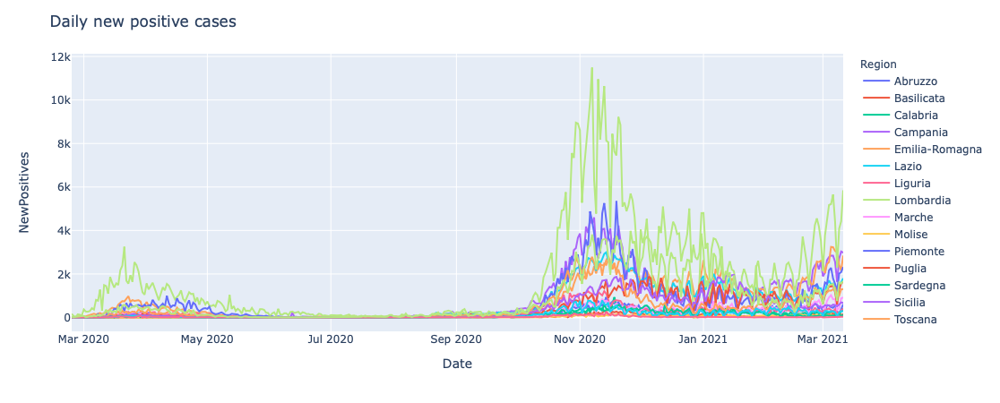

In [16]:
df2 = df

fig = px.line(df2, x="Date", y="NewPositives", color="Region", hover_name="Region",
        render_mode="svg", log_y=False)
fig.update_layout(title="Daily new positive cases")
fig.show()

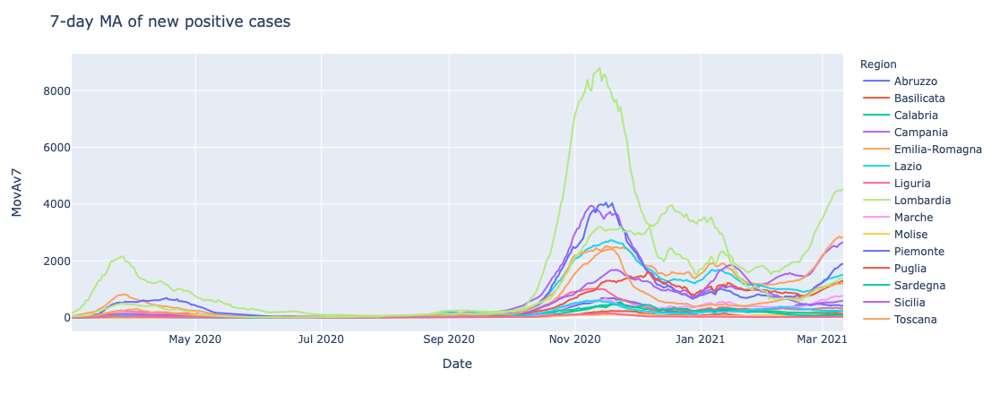

In [17]:
df2['MovAv7'] = df2['NewPositives'].rolling(window=7).mean()

fig = px.line(df2[df2.index>'2020-3-1'], x="Date", y="MovAv7", color="Region", hover_name="Region",
        render_mode="svg", log_y=False)
fig.update_layout(title="7-day MA of new positive cases")
fig.show()

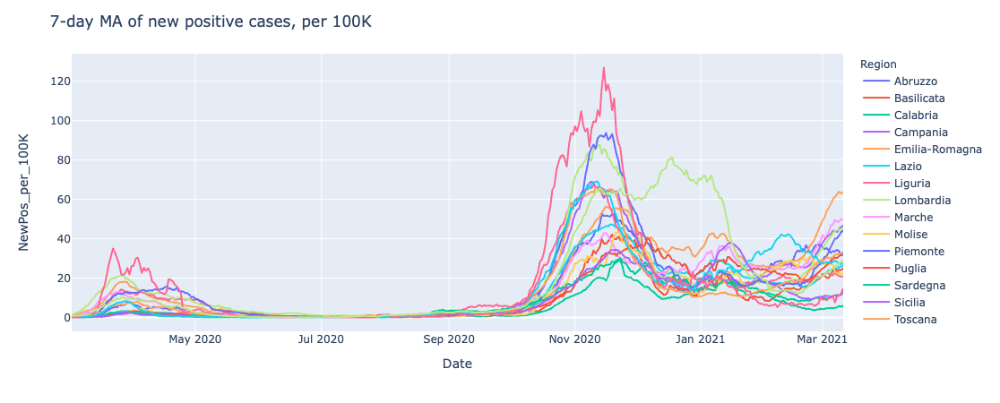

In [18]:
df2['NewPos_per_100K'] = df2['NewPositives']/df2['Pop']*1000_00

df2['NewPos_per_100K'] = df2['NewPos_per_100K'].rolling(window=7).mean()

fig = px.line(df2[df2.index>'2020-3-1'], x="Date", y="NewPos_per_100K", color="Region", 
              hover_name="Region", log_y=False)
fig.update_layout(title="7-day MA of new positive cases, per 100K")
fig.show()

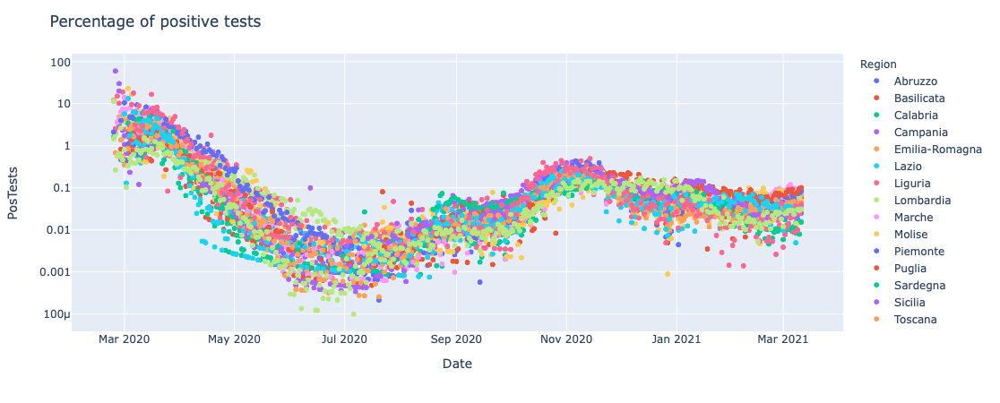

In [19]:
df2['PosTests'] = df2['NewPositives']/df2['NoOfTests']*100

fig = px.scatter(df2, y="PosTests", x="Date", color="Region", 
              hover_name="Region", log_y=True)
fig.update_layout(title="Percentage of positive tests")
fig.show()

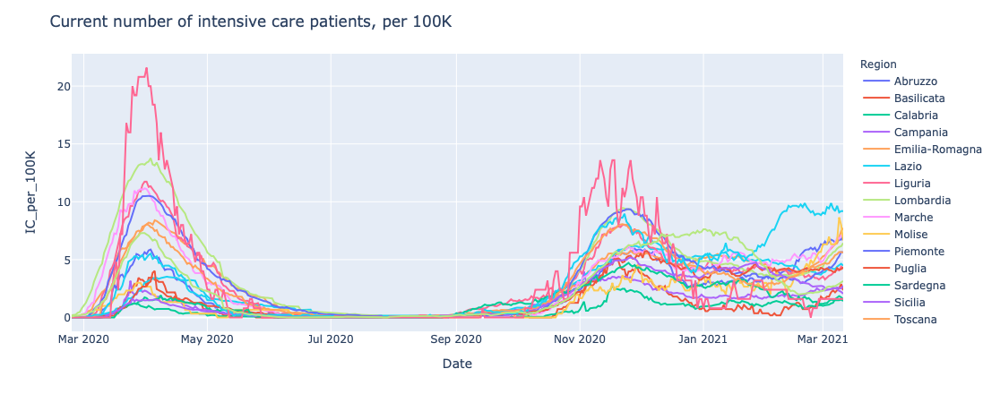

In [20]:
df2['IC_per_100K'] = df2['IC']/df2['Pop']*1000_00

fig = px.line(df2, x="Date", y="IC_per_100K", color="Region", hover_name="Region",
        render_mode="svg", log_y=False)
fig.update_layout(title="Current number of intensive care patients, per 100K")
fig.show()

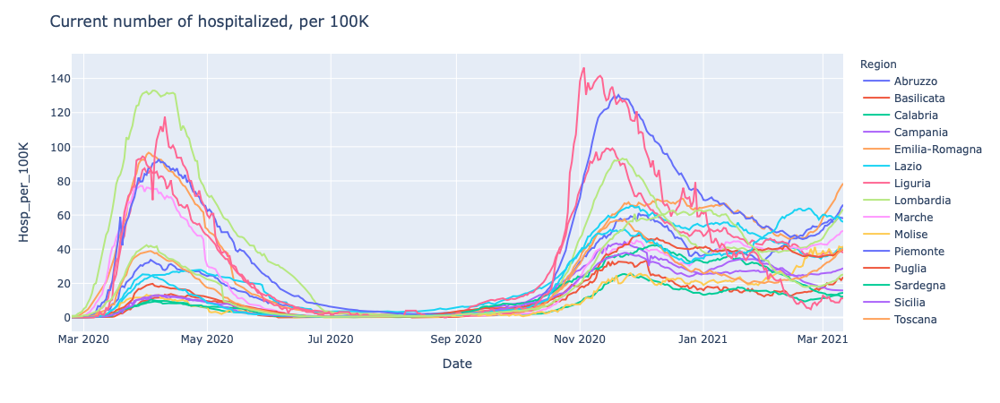

In [21]:
df2['Hosp_per_100K'] = df2['HospTotal']/df2['Pop']*1000_00

fig = px.line(df2, x="Date", y="Hosp_per_100K", color="Region", hover_name="Region",
        render_mode="svg", log_y=False)
fig.update_layout(title="Current number of hospitalized, per 100K")
fig.show()

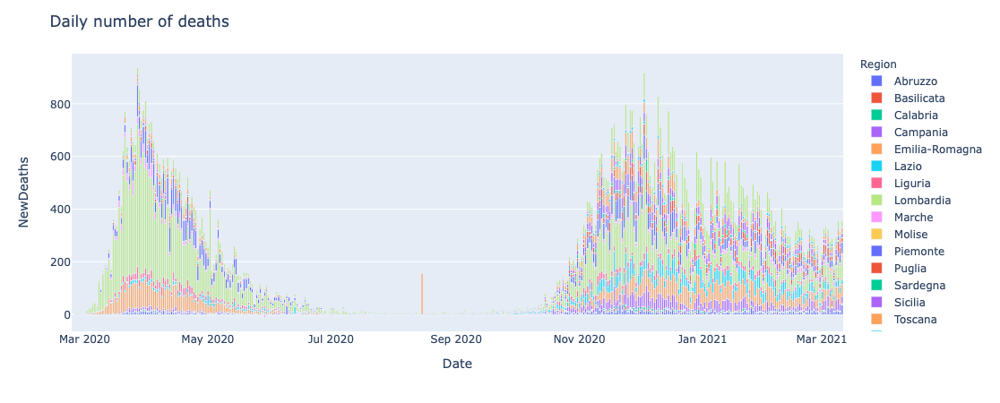

In [22]:
df3 = df2.copy()

df3['NewDeaths'] = df3['Deaths'] - df3.groupby(['Region'])['Deaths'].transform('shift')

fig = px.bar(df3, x=df3['Date'], y="NewDeaths", color="Region", hover_name="Date")
fig.update_layout(title="Daily number of deaths")
fig.show()

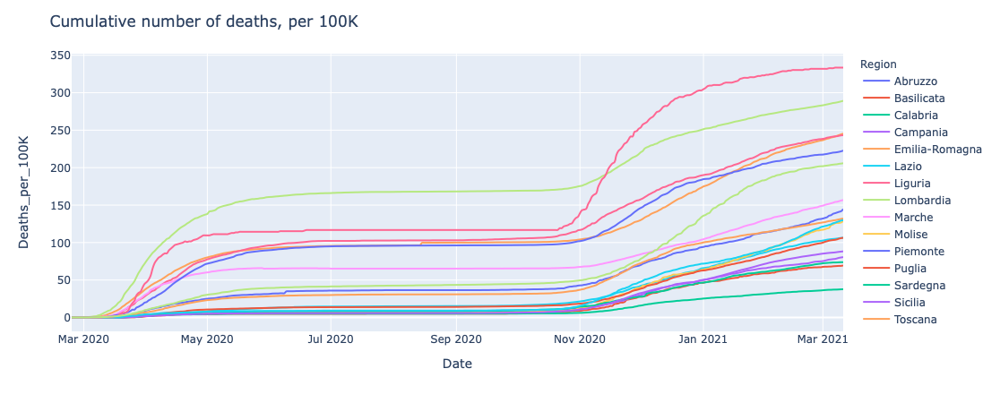

In [23]:
df2['Deaths_per_100K'] = (df2['Deaths']/df2['Pop'])*1000_00
fig = px.line(df2, x="Date", y="Deaths_per_100K", color="Region", 
              hover_name="Region", render_mode="svg", line_shape='spline')
fig.update_layout(title="Cumulative number of deaths, per 100K")
fig.show()

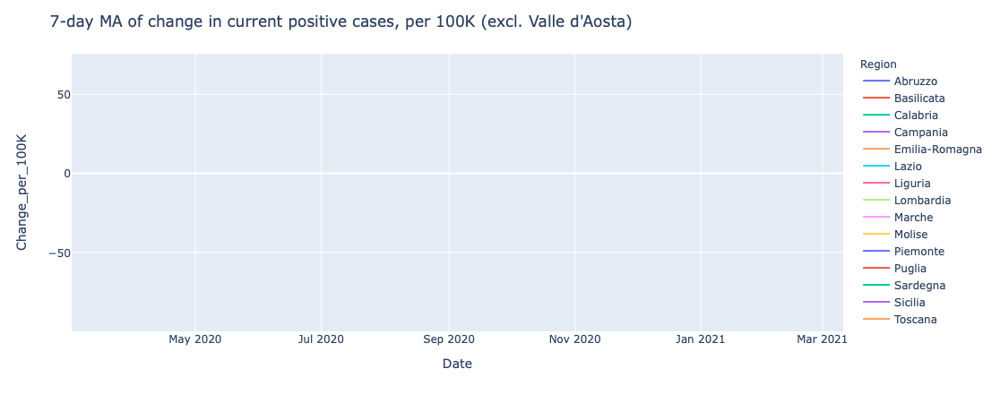

In [24]:
df2['Change_per_100K'] = df2['VariationOfPositives']/df2['Pop']*1000_00
df2['Change_per_100K'] = df2['Change_per_100K'].rolling(window=7).mean()

fig = px.line(df2[(df2.index>'2020-3-1') & (df2['Region']!="""Valle d'Aosta""")], x='Date', y="Change_per_100K", 
              color="Region", hover_name="Date")
fig.update_layout(title="7-day MA of change in current positive cases, per 100K (excl. Valle d'Aosta)")
fig.show()

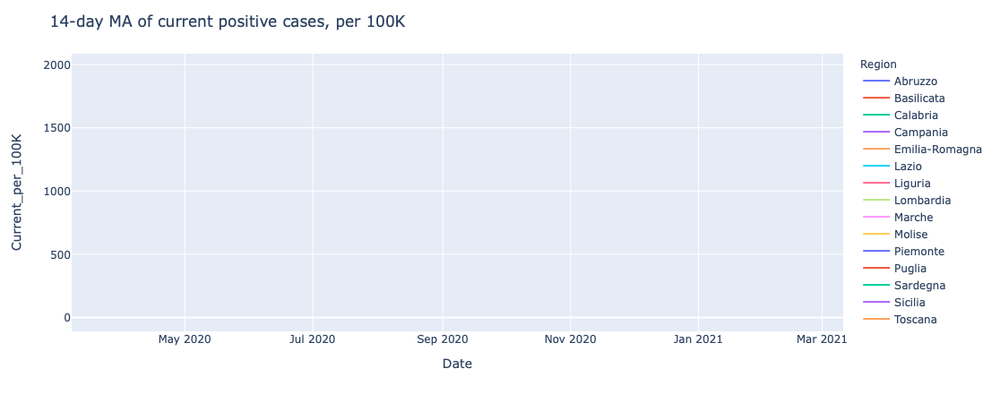

In [25]:
df2['Current_per_100K'] = df2['CurrentlyPositive']/df2['Pop']*1000_00
df2['Current_per_100K'] = df2['Current_per_100K'].rolling(window=14).mean()

fig = px.line(df2[(df2.index>'2020-3-7')], x='Date', y="Current_per_100K", color="Region", hover_name="Date")
fig.update_layout(title="14-day MA of current positive cases, per 100K")
fig.show()

___

&nbsp;

## All regions together

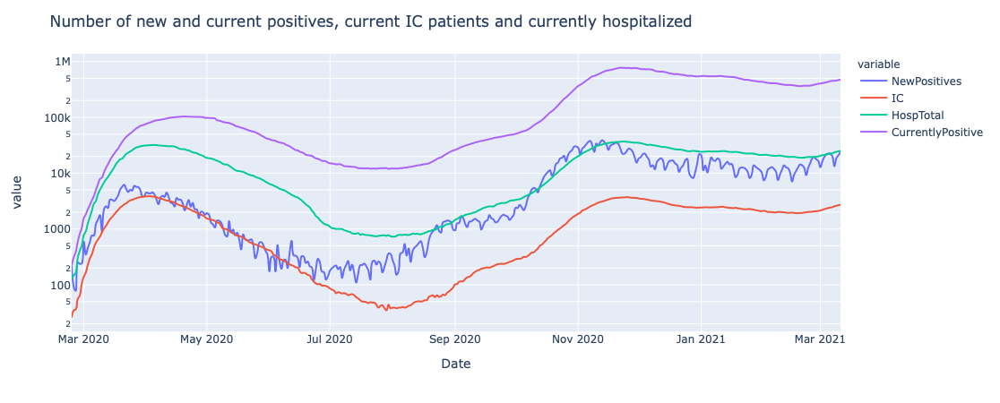

In [26]:
df2 = df
df_sum = df2.drop(['Lat','Long'], axis=1).groupby(df.Date).sum().reset_index()

df_sum2 = pd.melt(df_sum, id_vars=['Date'], value_vars=['NewPositives','IC','HospTotal','CurrentlyPositive'])

fig = px.line(df_sum2, x="Date", y="value", color='variable', hover_name="value", render_mode="svg", log_y=True, 
              line_shape='spline')
fig.update_layout(title="Number of new and current positives, current IC patients and currently hospitalized")
fig.show()

### Molecular test positive rate

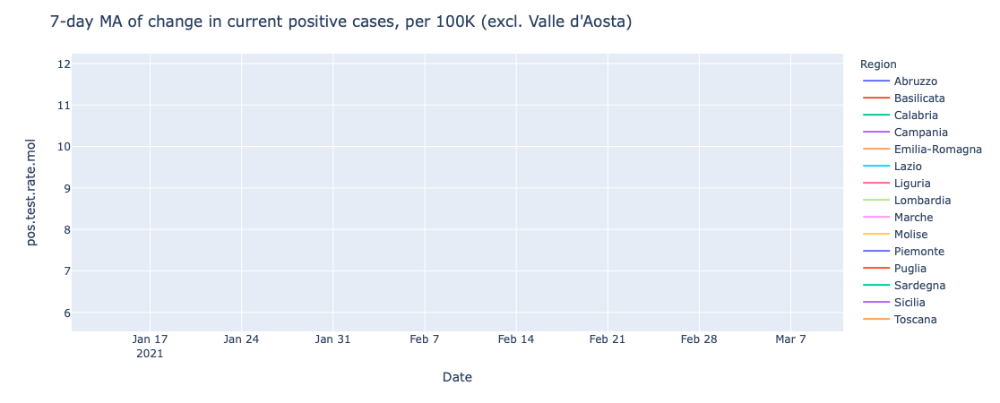

In [27]:
df2['pos.test.rate.mol'] = df2['totale_positivi_test_molecolare']/df2['tamponi_test_molecolare']*100


fig = px.line(df2[(df2.index>'2021-1-10') & (df2['Region']!="""Valle d'Aosta""")], x='Date', y="pos.test.rate.mol", 
              color="Region", hover_name="Date")
fig.update_layout(title="7-day MA of change in current positive cases, per 100K (excl. Valle d'Aosta)")
fig.show()

### Antigene test positive rate

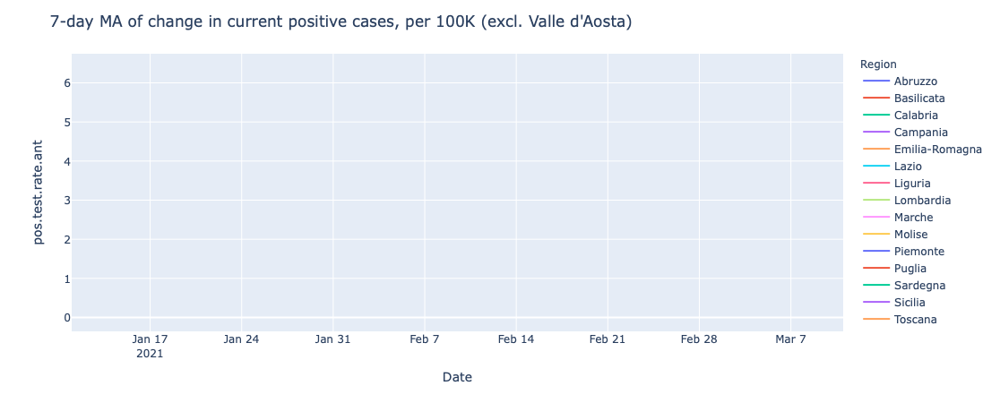

In [28]:
df2['pos.test.rate.ant'] = df2['totale_positivi_test_antigenico_rapido']/df2['tamponi_test_antigenico_rapido']*100


fig = px.line(df2[(df2.index>'2021-1-10') & (df2['Region']!="""Valle d'Aosta""")], x='Date', y="pos.test.rate.ant", 
              color="Region", hover_name="Date")
fig.update_layout(title="7-day MA of change in current positive cases, per 100K (excl. Valle d'Aosta)")
fig.show()